# AHousehold Appliances energy prediction

### Group No. :25

### Kavindya P.P     : EG/2020/4021
### Kumarasiri L.I.N : EG/2020/4034

## 1. Analysing Data

In [93]:
# Import Libraries
import numpy as np
import pandas as pd
from datetime import datetime as dt

# Import Data Visualisation Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as pl
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from pandas.plotting import scatter_matrix
%matplotlib inline

# Set the plot style and display options
plt.style.use('ggplot')
sns.set()

# To display all the columns in Dataframe
pd.set_option('display.max_columns', None)
# Import Library to visualise missing data
import missingno as mno

# Import and Ignore warnings for better code readability,
import warnings
warnings.filterwarnings('ignore')

In [94]:
#importing the data set
data_raw = pd.read_csv('energydata_complete.csv')


In [95]:
#creating a copy of data set
data = data_raw.copy()

### Dataset First View

In [96]:
# Dataset First Look
data.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,55.20,7.026667,84.256667,17.200000,41.626667,18.2,48.900000,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,55.20,6.833333,84.063333,17.200000,41.560000,18.2,48.863333,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,55.09,6.560000,83.156667,17.200000,41.433333,18.2,48.730000,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,17.166667,55.09,6.433333,83.423333,17.133333,41.290000,18.1,48.590000,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,17.200000,55.09,6.366667,84.893333,17.200000,41.230000,18.1,48.590000,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


### Variables Description

#### The observation data consists of the following variables:

datetime year-month-day hour : minute:second

Appliances: energy use in Wh [TARGETED]

lights: energy use of light fixtures in the house in Wh

T1: Temperature in kitchen area, in Celsius

RH_1: Humidity in kitchen area, in %

T2: Temperature in living room area, in Celsius

RH_2:Humidity in living room area, in %

T3:Temperature in laundry room area

RH_3:Humidity in laundry room area, in %

T4:Temperature in office room, in Celsius

RH_4:Humidity in office room, in %

T5:Temperature in bathroom, in Celsius

RH_5:Humidity in bathroom, in %

T6:Temperature outside the building (north side), in Celsius

RH_6:Humidity outside the building (north side), in %

T7:Temperature in ironing room , in Celsius

RH_7:Humidity in ironing room, in %

T8:Temperature in teenager room 2, in Celsius

RH_8:Humidity in teenager room 2, in %

T9:Temperature in parents room, in Celsius

RH_9:Humidity in parents room, in %

T_out:Temperature outside (from Chièvres weather station), in Celsius

Press_mm_hg: (from Chièvres weather station), in mm Hg

RH_out: Humidity outside (from Chièvres weather station), in %

Windspeed: (from Chièvres weather station), in m/s

Visibility: (from Chièvres weather station), in km

Tdewpoint: (from Chièvres weather station), °C

rv1: Random variable 1, nondimensional

rv2: Rnadom variable 2, nondimensional

In [97]:
# Dataset Rows & Columns count
num_rows, num_cols = data.shape

print("Number of rows:", num_rows)
print("Number of columns:", num_cols)

Number of rows: 19735
Number of columns: 29


### Dataset Information

In [98]:
# convert the 'date' column in DataFrame to a datetime format using the pd.to_datetime() function
data['date'] = pd.to_datetime(data['date'])

In [7]:
# Dataset Info
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         19735 non-null  datetime64[ns]
 1   Appliances   19735 non-null  int64         
 2   lights       19735 non-null  int64         
 3   T1           19735 non-null  float64       
 4   RH_1         19735 non-null  float64       
 5   T2           19735 non-null  float64       
 6   RH_2         19735 non-null  float64       
 7   T3           19735 non-null  float64       
 8   RH_3         19735 non-null  float64       
 9   T4           19735 non-null  float64       
 10  RH_4         19735 non-null  float64       
 11  T5           19735 non-null  float64       
 12  RH_5         19735 non-null  float64       
 13  T6           19735 non-null  float64       
 14  RH_6         19735 non-null  float64       
 15  T7           19735 non-null  float64       
 16  RH_7

In [99]:
# Setting date as the index:
data.set_index('date', inplace=True)

### Checking Duplicate Values 

In [100]:
# Dataset Duplicate Value Count assinged a dataframe name 'df'
df = data[data.duplicated()]

In [101]:
#There is no duplicate rows in the data
df.head()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,


### Cheking Missing Values/Null Values

In [102]:
# Missing Values/Null Values Count
data.isna().sum()

Appliances     0
lights         0
T1             0
RH_1           0
T2             0
RH_2           0
T3             0
RH_3           0
T4             0
RH_4           0
T5             0
RH_5           0
T6             0
RH_6           0
T7             0
RH_7           0
T8             0
RH_8           0
T9             0
RH_9           0
T_out          0
Press_mm_hg    0
RH_out         0
Windspeed      0
Visibility     0
Tdewpoint      0
rv1            0
rv2            0
dtype: int64

# 2. Analysing the Features/Variables

In [103]:
# Dataset Columns
data.columns

Index(['Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4',
       'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9',
       'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

In [104]:
# Dataset Describe
data.describe(include='all')

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,19.592106,50.949283,7.910939,54.609083,20.267106,35.388200,22.029107,42.936165,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,1.844623,9.022034,6.090347,31.149806,2.109993,5.114208,1.956162,5.224361,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,15.330000,29.815000,-6.065000,1.000000,15.390000,23.200000,16.306667,29.600000,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,18.277500,45.400000,3.626667,30.025000,18.700000,31.500000,20.790000,39.066667,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,19.390000,49.090000,7.300000,55.290000,20.033333,34.863333,22.100000,42.375000,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,20.619643,53.663333,11.256000,83.226667,21.600000,39.000000,23.390000,46.536000,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,25.795000,96.321667,28.290000,99.900000,26.000000,51.400000,27.230000,58.780000,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


### Check Unique Values for each variable

In [105]:
# Checking Unique Values count for each variable.
for i in data.columns.tolist():
  print("The unique values in",i, "is",data[i].nunique(),".")

The unique values in Appliances is 92 .
The unique values in lights is 8 .
The unique values in T1 is 722 .
The unique values in RH_1 is 2547 .
The unique values in T2 is 1650 .
The unique values in RH_2 is 3376 .
The unique values in T3 is 1426 .
The unique values in RH_3 is 2618 .
The unique values in T4 is 1390 .
The unique values in RH_4 is 2987 .
The unique values in T5 is 2263 .
The unique values in RH_5 is 7571 .
The unique values in T6 is 4446 .
The unique values in RH_6 is 9709 .
The unique values in T7 is 1955 .
The unique values in RH_7 is 5891 .
The unique values in T8 is 2228 .
The unique values in RH_8 is 6649 .
The unique values in T9 is 924 .
The unique values in RH_9 is 3388 .
The unique values in T_out is 1730 .
The unique values in Press_mm_hg is 2189 .
The unique values in RH_out is 566 .
The unique values in Windspeed is 189 .
The unique values in Visibility is 413 .
The unique values in Tdewpoint is 1409 .
The unique values in rv1 is 19735 .
The unique values in r

In [15]:
# Round the unique values to two decimal places
rounded_unique_values = data.apply(lambda x: set(round(val, 2) for val in x))

# Print the unique values for each feature
for feature, unique in rounded_unique_values.items():
    print(f'{feature}: {unique}')

Appliances: {520, 10, 530, 20, 540, 30, 550, 40, 1070, 560, 50, 1080, 570, 60, 580, 70, 590, 80, 600, 90, 610, 100, 620, 110, 630, 120, 640, 130, 650, 140, 660, 150, 670, 160, 680, 170, 690, 180, 700, 190, 710, 200, 720, 210, 730, 220, 740, 230, 750, 240, 760, 250, 770, 260, 780, 270, 790, 280, 800, 290, 300, 820, 310, 830, 320, 840, 330, 850, 340, 860, 350, 870, 360, 880, 370, 890, 380, 900, 390, 910, 400, 410, 420, 430, 440, 450, 460, 470, 480, 490, 500, 510}
lights: {0, 70, 40, 10, 50, 20, 60, 30}
T1: {23.47, 23.97, 23.72, 24.21, 24.71, 16.89, 17.89, 18.03, 18.53, 20.63, 21.12, 21.62, 23.02, 19.39, 19.27, 19.96, 20.7, 19.86, 20.89, 21.1, 23.07, 23.76, 24.0, 25.03, 26.03, 24.47, 24.22, 17.5, 17.0, 17.53, 18.5, 18.47, 18.0, 19.53, 19.03, 19.0, 19.5, 20.53, 20.03, 20.72, 20.22, 20.5, 21.03, 21.5, 21.53, 21.47, 21.0, 22.5, 22.0, 21.75, 21.25, 22.03, 23.0, 23.5, 23.03, 23.53, 22.53, 24.03, 23.22, 24.5, 24.53, 24.72, 25.5, 17.1, 25.0, 24.75, 25.53, 26.0, 23.66, 18.1, 24.16, 20.1, 22.65, 2

# 3. Data Wrangling

### Data Wrangling Code
"Data Wrangling" refers to the process of cleaning, organizing, and transforming raw and unstructured data into a format that is more suitable for analysis. It involves various tasks such as handling missing data, converting data types, dealing with outliers, and restructuring data.

In [106]:
# Separating columns:
temperature_column = [i for i in data.columns if "T" in i]
humidity_column = [i for i in data.columns if "RH" in i]
other = [i for i in data.columns if ("T" not in i)&("RH" not in i)]

In [107]:
#close look on temprature column
data[temperature_column].describe(include='all')

,T1,T2,T3,T4,T5,T6,T7,T8,T9,T_out,Tdewpoint
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,21.686571,20.341219,22.267611,20.855335,19.592106,7.910939,20.267106,22.029107,19.485828,7.411665,3.760707
std,1.606066,2.192974,2.006111,2.042884,1.844623,6.090347,2.109993,1.956162,2.014712,5.317409,4.194648
min,16.790000,16.100000,17.200000,15.100000,15.330000,-6.065000,15.390000,16.306667,14.890000,-5.000000,-6.600000
25%,20.760000,18.790000,20.790000,19.530000,18.277500,3.626667,18.700000,20.790000,18.000000,3.666667,0.900000
50%,21.600000,20.000000,22.100000,20.666667,19.390000,7.300000,20.033333,22.100000,19.390000,6.916667,3.433333
75%,22.600000,21.500000,23.290000,22.100000,20.619643,11.256000,21.600000,23.390000,20.600000,10.408333,6.566667
max,26.260000,29.856667,29.236000,26.200000,25.795000,28.290000,26.000000,27.230000,24.500000,26.100000,15.500000


In [108]:
#close look on humidity column
data[humidity_column].describe()

,RH_1,RH_2,RH_3,RH_4,RH_5,RH_6,RH_7,RH_8,RH_9,RH_out
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,40.259739,40.420420,39.242500,39.026904,50.949283,54.609083,35.388200,42.936165,41.552401,79.750418
std,3.979299,4.069813,3.254576,4.341321,9.022034,31.149806,5.114208,5.224361,4.151497,14.901088
min,27.023333,20.463333,28.766667,27.660000,29.815000,1.000000,23.200000,29.600000,29.166667,24.000000
25%,37.333333,37.900000,36.900000,35.530000,45.400000,30.025000,31.500000,39.066667,38.500000,70.333333
50%,39.656667,40.500000,38.530000,38.400000,49.090000,55.290000,34.863333,42.375000,40.900000,83.666667
75%,43.066667,43.260000,41.760000,42.156667,53.663333,83.226667,39.000000,46.536000,44.338095,91.666667
max,63.360000,56.026667,50.163333,51.090000,96.321667,99.900000,51.400000,58.780000,53.326667,100.000000


In [109]:
# other data columns
data[other].describe()

,Appliances,lights,Press_mm_hg,Windspeed,Visibility,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,755.522602,4.039752,38.330834,24.988033,24.988033
std,102.524891,7.935988,7.399441,2.451221,11.794719,14.496634,14.496634
min,10.000000,0.000000,729.300000,0.000000,1.000000,0.005322,0.005322
25%,50.000000,0.000000,750.933333,2.000000,29.000000,12.497889,12.497889
50%,60.000000,0.000000,756.100000,3.666667,40.000000,24.897653,24.897653
75%,100.000000,0.000000,760.933333,5.500000,40.000000,37.583769,37.583769
max,1080.000000,70.000000,772.300000,14.000000,66.000000,49.996530,49.996530


In [111]:
# Create a dictionary to map current column names to new column names
column_mapping = {'T1': 'KITCHEN_TEMP',
    'RH_1': 'KITCHEN_HUM',
    'T2': 'LIVING_TEMP',
    'RH_2' :'LIVING_HUM',
    'T3': 'BEDROOM_TEMP',
    'RH_3':'BEDROOM_HUM',
    'T4' : 'OFFICE_TEMP',
    'RH_4' : 'OFFICE_HUM',
    'T5' : 'BATHROOM_TEMP',
    'RH_5': 'BATHROOM_HUM',
    'T6':'OUTSIDE_TEMP_build',
    'RH_6': 'OUTSIDE_HUM_build',
    'T7': 'IRONING_ROOM_TEMP',
    'RH_7' : 'IRONING_ROOM_HUM',
    'T8' :'TEEN_ROOM_2_TEMP',        
    'RH_8' : 'TEEN_ROOM_HUM',
    'T9': 'PARENTS_ROOM_TEMP',
    'RH_9': 'PARENTS_ROOM_HUM',
    'T_out' :'OUTSIDE_TEMP_wstn',
    'RH_out' :'OUTSIDE_HUM_wstn'}

# Rename the columns using the mapping
data.rename(columns=column_mapping, inplace=True)

In [112]:
data.head()

,Appliances,lights,KITCHEN_TEMP,KITCHEN_HUM,LIVING_TEMP,LIVING_HUM,BEDROOM_TEMP,BEDROOM_HUM,OFFICE_TEMP,OFFICE_HUM,BATHROOM_TEMP,BATHROOM_HUM,OUTSIDE_TEMP_build,OUTSIDE_HUM_build,IRONING_ROOM_TEMP,IRONING_ROOM_HUM,TEEN_ROOM_2_TEMP,TEEN_ROOM_HUM,PARENTS_ROOM_TEMP,PARENTS_ROOM_HUM,OUTSIDE_TEMP_wstn,Press_mm_hg,OUTSIDE_HUM_wstn,Windspeed,Visibility,Tdewpoint,rv1,rv2
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,55.20,7.026667,84.256667,17.200000,41.626667,18.2,48.900000,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,55.20,6.833333,84.063333,17.200000,41.560000,18.2,48.863333,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,55.09,6.560000,83.156667,17.200000,41.433333,18.2,48.730000,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,17.166667,55.09,6.433333,83.423333,17.133333,41.290000,18.1,48.590000,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,17.200000,55.09,6.366667,84.893333,17.200000,41.230000,18.1,48.590000,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [113]:
#creating new features
data['month'] = data.index.month
data['weekday'] = data.index.weekday
data['hour'] = data.index.hour
data['day'] = data.index.day
data['day_of_week'] = data.index.dayofweek

In [115]:
data.head(3)

,Appliances,lights,KITCHEN_TEMP,KITCHEN_HUM,LIVING_TEMP,LIVING_HUM,BEDROOM_TEMP,BEDROOM_HUM,OFFICE_TEMP,OFFICE_HUM,BATHROOM_TEMP,BATHROOM_HUM,OUTSIDE_TEMP_build,OUTSIDE_HUM_build,IRONING_ROOM_TEMP,IRONING_ROOM_HUM,TEEN_ROOM_2_TEMP,TEEN_ROOM_HUM,PARENTS_ROOM_TEMP,PARENTS_ROOM_HUM,OUTSIDE_TEMP_wstn,Press_mm_hg,OUTSIDE_HUM_wstn,Windspeed,Visibility,Tdewpoint,rv1,rv2,month,weekday,hour,day,day_of_week
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,55.20,7.026667,84.256667,17.2,41.626667,18.2,48.900000,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433,1,0,17,11,0
2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,55.20,6.833333,84.063333,17.2,41.560000,18.2,48.863333,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195,1,0,17,11,0
2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,55.09,6.560000,83.156667,17.2,41.433333,18.2,48.730000,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668,1,0,17,11,0


In [114]:
# Counting values of the "lights" column:
data['lights'].value_counts(normalize=True)

lights
0     0.772840
10    0.112085
20    0.082290
30    0.028325
40    0.003902
50    0.000456
70    0.000051
60    0.000051
Name: proportion, dtype: float64

77% value of lights column are 0 and it is not relevant for prediction. so we can drop this column

In [116]:
# Dropping the lights column:
data.drop(columns='lights', inplace=True)

In [117]:
#reorder the data for clear vision
desired_order = ['KITCHEN_TEMP','LIVING_TEMP','BEDROOM_TEMP','OFFICE_TEMP','BATHROOM_TEMP','OUTSIDE_TEMP_build','IRONING_ROOM_TEMP','TEEN_ROOM_2_TEMP','PARENTS_ROOM_TEMP','OUTSIDE_TEMP_wstn',
                 'KITCHEN_HUM','LIVING_HUM','BEDROOM_HUM','OFFICE_HUM','BATHROOM_HUM','OUTSIDE_HUM_build','IRONING_ROOM_HUM','TEEN_ROOM_HUM','PARENTS_ROOM_HUM','OUTSIDE_HUM_wstn',
                 "Tdewpoint","Press_mm_hg","Windspeed","Visibility","rv1", "rv2",'month','weekday','hour','day','day_of_week',"Appliances"]
#assinging new_data as new name of dataframe
data = data.reindex(columns=desired_order)

removes the 'lights' column and reorders the columns in DataFrame (data) to have a clear and organized structure, with temperature, humidity, additional features, and time-related features grouped in a specific order. 

In [118]:
data.tail(2)

,KITCHEN_TEMP,LIVING_TEMP,BEDROOM_TEMP,OFFICE_TEMP,BATHROOM_TEMP,OUTSIDE_TEMP_build,IRONING_ROOM_TEMP,TEEN_ROOM_2_TEMP,PARENTS_ROOM_TEMP,OUTSIDE_TEMP_wstn,KITCHEN_HUM,LIVING_HUM,BEDROOM_HUM,OFFICE_HUM,BATHROOM_HUM,OUTSIDE_HUM_build,IRONING_ROOM_HUM,TEEN_ROOM_HUM,PARENTS_ROOM_HUM,OUTSIDE_HUM_wstn,Tdewpoint,Press_mm_hg,Windspeed,Visibility,rv1,rv2,month,weekday,hour,day,day_of_week,Appliances
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-05-27 17:50:00,25.5,25.414000,26.890000,24.7,23.2,22.433333,24.5,24.6625,23.2,22.333333,46.99,43.036000,41.290000,45.790000,52.2,1.0,44.295714,49.51875,46.8175,56.666667,13.233333,755.2,3.833333,26.166667,6.322784,6.322784,5,4,17,27,4,420
2016-05-27 18:00:00,25.5,25.264286,26.823333,24.7,23.2,21.026667,24.5,24.7360,23.2,22.200000,46.60,42.971429,41.156667,45.963333,52.2,1.0,44.054000,49.73600,46.8450,57.000000,13.200000,755.2,4.000000,27.000000,34.118851,34.118851,5,4,18,27,4,430


# 4. Data Vizualization

### chart 1

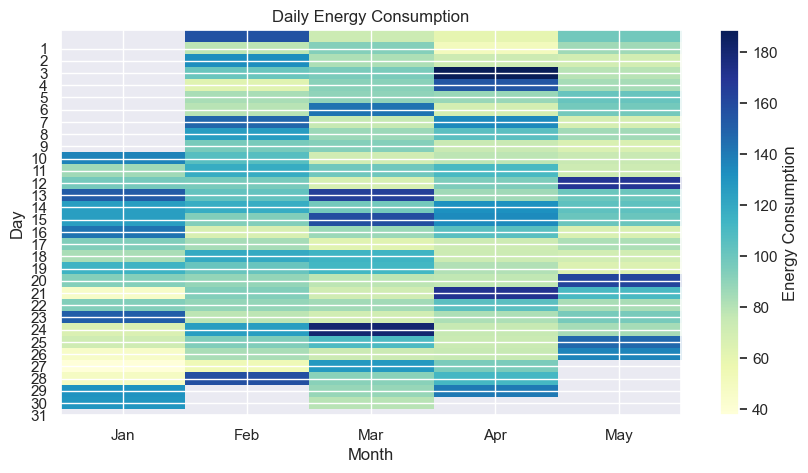

In [28]:
# Create a pivot table to aggregate the daily energy consumption
daily_energy = data.pivot_table(values='Appliances', index='day', columns='month', aggfunc = 'mean')

# Create a heatmap using the pivot table
plt.figure(figsize=(10, 5))
plt.title('Daily Energy Consumption')
plt.xlabel('Month')
plt.ylabel('Day')
plt.imshow(daily_energy, cmap='YlGnBu', aspect='auto')
plt.colorbar(label='Energy Consumption')
plt.xticks(range(0,5), ['Jan', 'Feb', 'Mar', 'Apr', 'May'])
plt.yticks(range(1, 32))
plt.show()

The image shows that energy consumption is typically higher in the winter months, and lower in the summer months. There is also a peak in energy consumption in the middle of each month.
 

### Chart - 2

Text(0, 0.5, 'Energy Consumption')

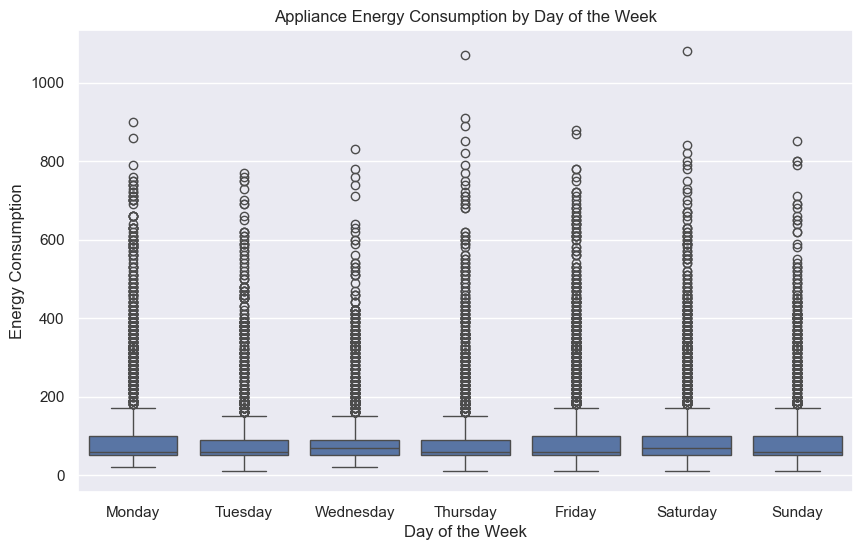

In [119]:
# Map the day of the week values to their respective names
day_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
data['day_of_week'] = data['day_of_week'].map(lambda x: day_names[x])

# Create a box plot or violin plot to compare energy consumption across different days of the week
plt.figure(figsize=(10, 6))
sns.boxplot(x='day_of_week', y='Appliances', data=data, order=day_names)  # or sns.violinplot()
plt.title('Appliance Energy Consumption by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Energy Consumption')

   The median energy consumption is lowest on Monday and highest on Friday. indicating that there is more variation in energy consumption on this day. This may be due to increased weekend activity, such as cooking and entertaining.
  The heatmap might reveal a recurring pattern of higher energy consumption on weekends (e.g., Saturdays and Sundays) compared to weekdays. This could be due to increased activities or appliance usage on weekends.

### Chart - 3

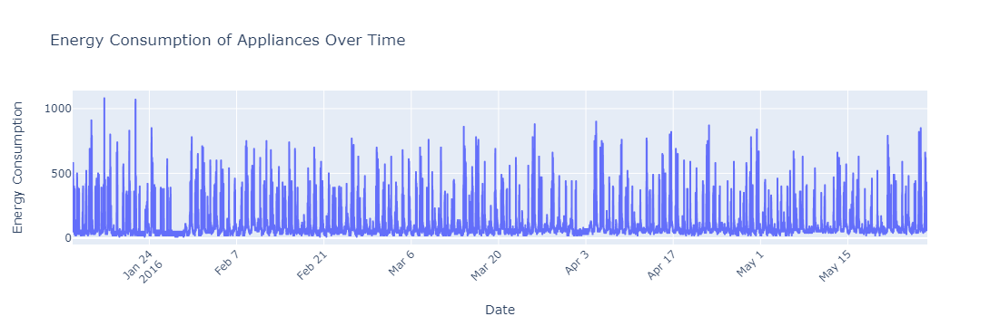

In [120]:
# Create a line plot to show the trend of energy consumption over time


# Assuming you have a DataFrame 'data' with a datetime index
fig = px.line(data, x=data.index, y='Appliances', title='Energy Consumption of Appliances Over Time')
fig.update_xaxes(title_text='Date', tickangle=-45)
fig.update_yaxes(title_text='Energy Consumption')

# Show the Plotly figure
fig.show()

The presence of high and low spikes indicates variations in energy usage.
-The chart also highlights outliers or anomalies in energy consumption. These are data points significantly deviating from the usual pattern and could be worth investigating for their underlying causes.

### Chart-4

In [121]:
# Dropping the lights column:
data.drop(columns='day_of_week', inplace=True)

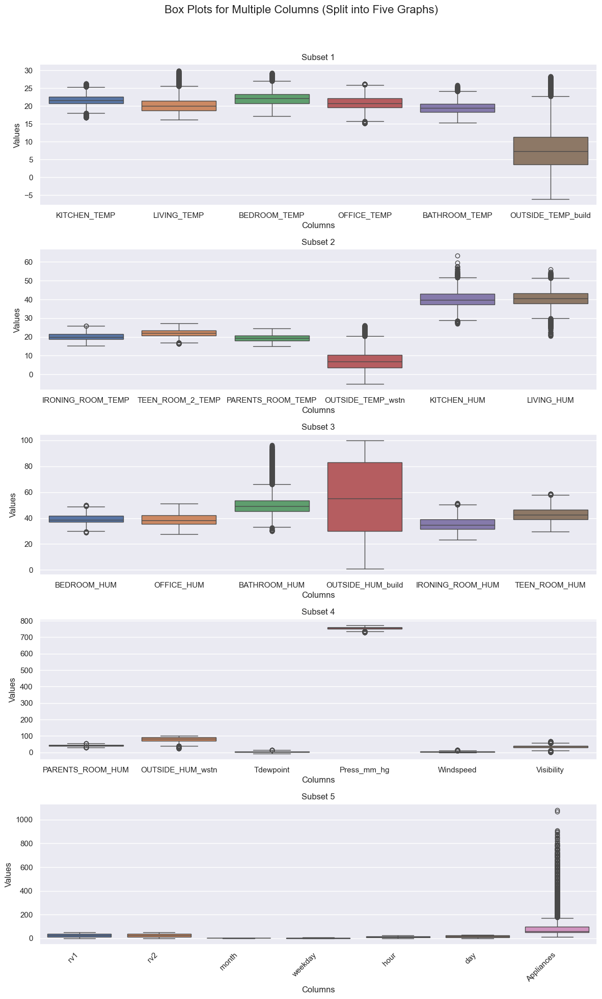

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
num_columns = len(data.columns)
columns_to_plot = [column for column in data.columns if column != 'day_of_week']

# Create five subplots
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(12, 20))
fig.suptitle('Box Plots for Multiple Columns (Split into Five Graphs)', fontsize=16)

# Plot the subsets of columns
for i in range(5):
    start_idx = i * len(columns_to_plot) // 5
    end_idx = (i + 1) * len(columns_to_plot) // 5
    sns.boxplot(data=data[columns_to_plot[start_idx:end_idx]], ax=axes[i])
    axes[i].set_title(f'Subset {i+1}')
    axes[i].set_xlabel('Columns')
    axes[i].set_ylabel('Values')

plt.xticks(rotation=45, ha='right')
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust the layout to prevent title overlap
plt.show()


### Chart - 5¶

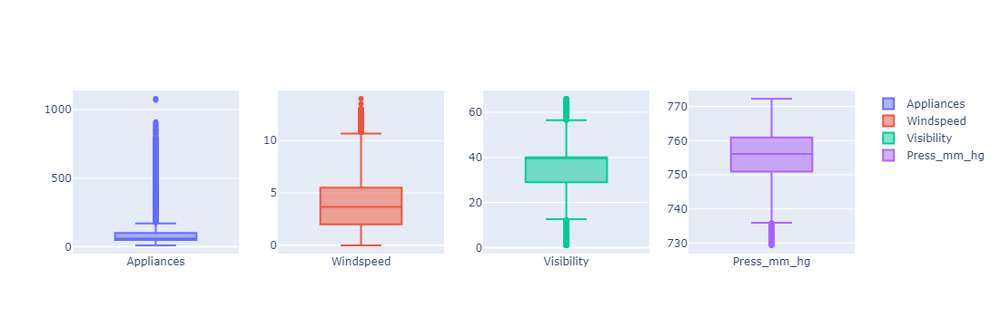

In [122]:
# Chart - 5 visualization code
#close look on four columns
fig_sub = make_subplots(rows=1, cols=4, shared_yaxes=False)

fig_sub.add_trace(go.Box(y=data['Appliances'].values,name='Appliances'),row=1, col=1)
fig_sub.add_trace(go.Box(y=data['Windspeed'].values,name='Windspeed'),row=1, col=2)
fig_sub.add_trace(go.Box(y=data['Visibility'].values,name='Visibility'),row=1, col=3)
fig_sub.add_trace(go.Box(y=data['Press_mm_hg'].values,name='Press_mm_hg'),row=1, col=4)

fig_sub.show()

Appliances Distribution: The 'Appliances' column exhibits a wide range of values, indicating varying energy consumption.

Windspeed Range: 'Windspeed' data has a broad distribution with potential outliers, suggesting fluctuating wind speeds.

Visibility Distribution: 'Visibility' data also varies significantly, signifying varying levels of visibility.

Pressure Variability: 'Press_mm_hg' displays variations and potential outliers, indicating fluctuations in atmospheric pressure.

### Chart - 6

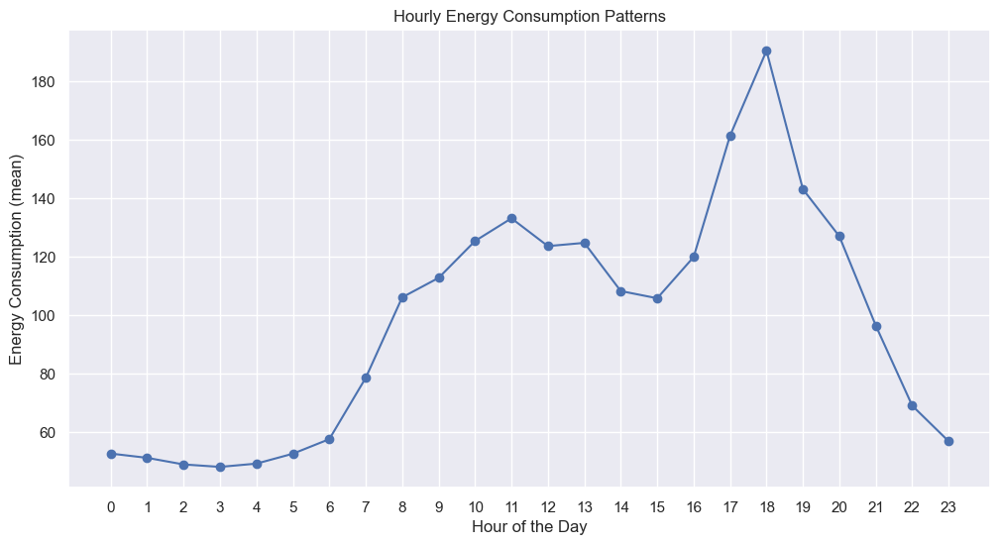

In [124]:
hourly_energy = data.groupby('hour')['Appliances'].mean()

# Create a line chart to visualize the hourly energy consumption patterns
plt.figure(figsize=(12, 6))
plt.plot(hourly_energy.index, hourly_energy.values, marker='o', linestyle='-')
plt.title('Hourly Energy Consumption Patterns')
plt.xlabel('Hour of the Day')
plt.ylabel('Energy Consumption (mean)')
plt.xticks(range(24))
plt.grid(True) 
plt.show()


Peak Hours: There is a notable rise in energy consumption from 6 am to 6 pm. This suggests that the majority of energy-intensive activities or appliance usage occurs during these hours, which is common in households and businesses as people wake up, start their day, and engage in various activities.

Evening Decline: After 6 pm, there is a decline in energy consumption. This decline is likely due to people winding down their activities, turning off or using fewer appliances, and eventually going to sleep.

Midday Dip: There is a small dip in energy consumption between 11 am and 3 pm. This could be attributed to reduced activity during the midday hours when people might be at work or engaged in activities outside the home, resulting in lower energy usage.

### Chart - 7

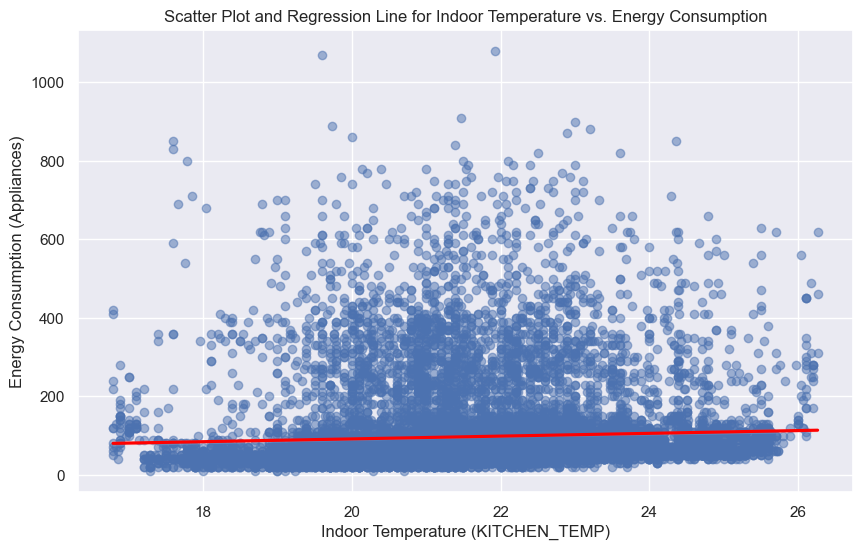

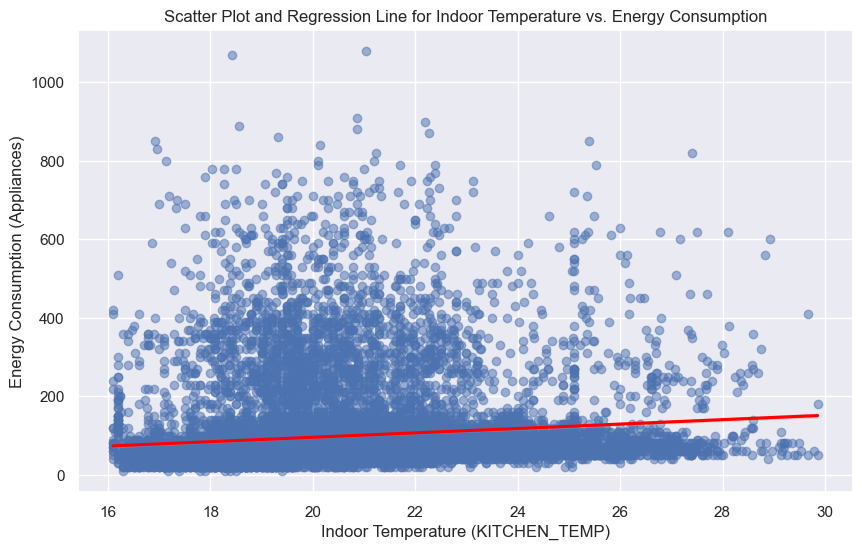

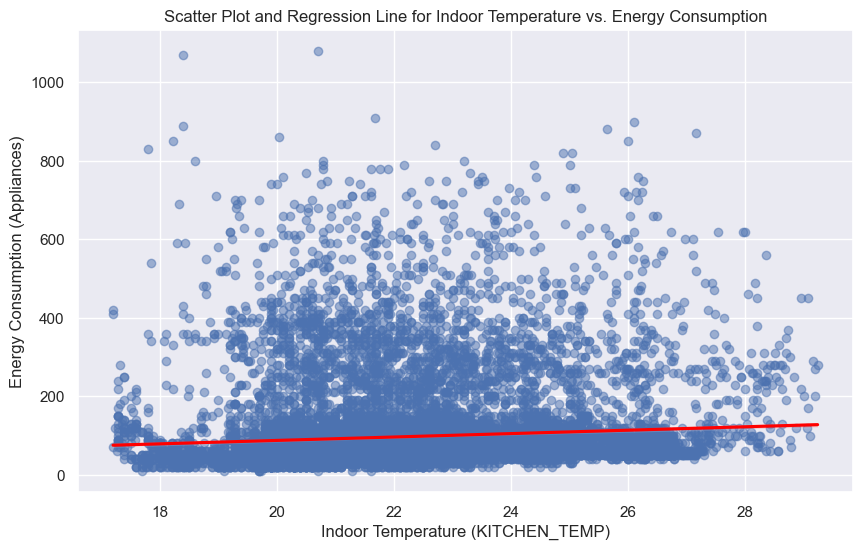

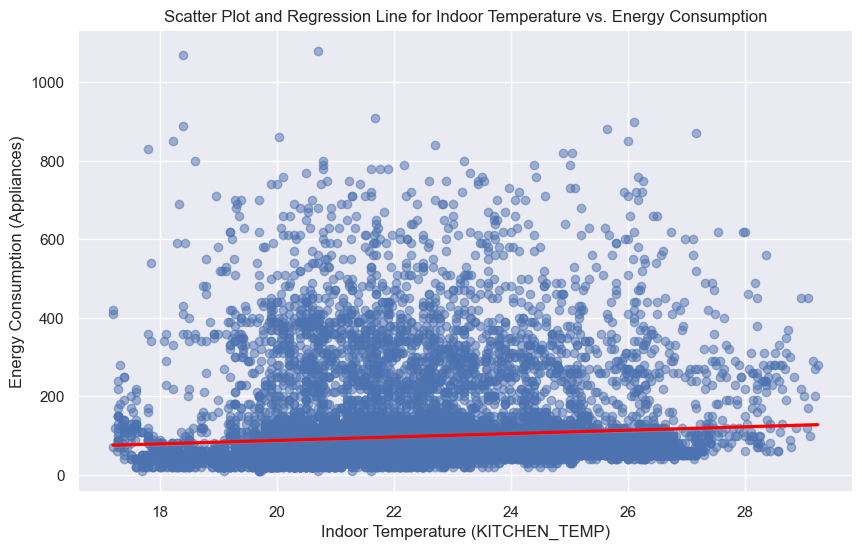

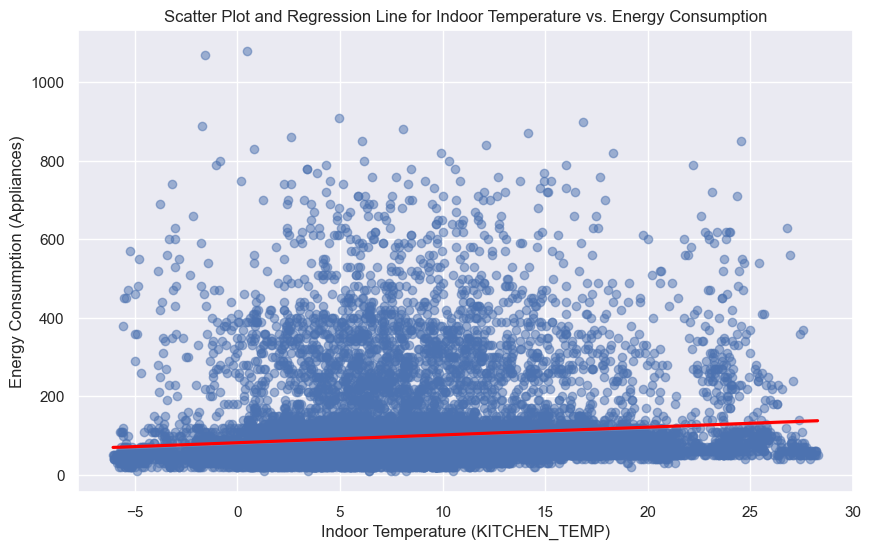

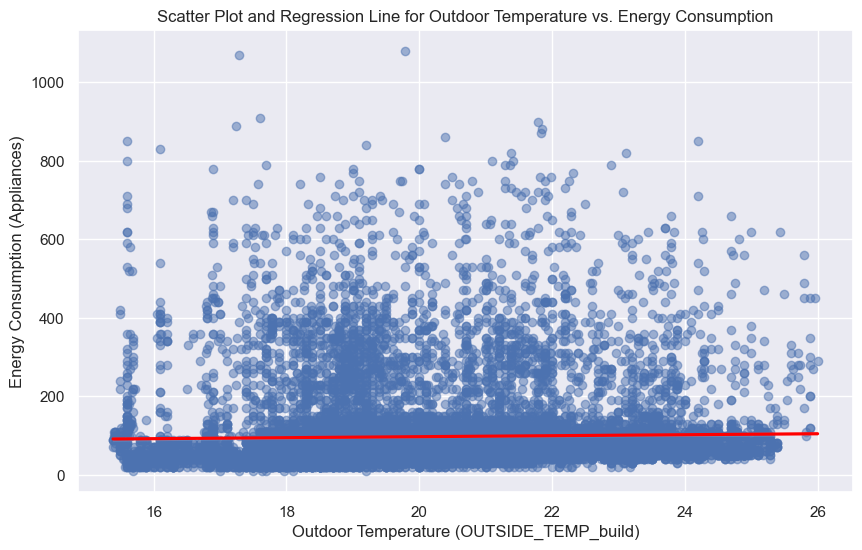

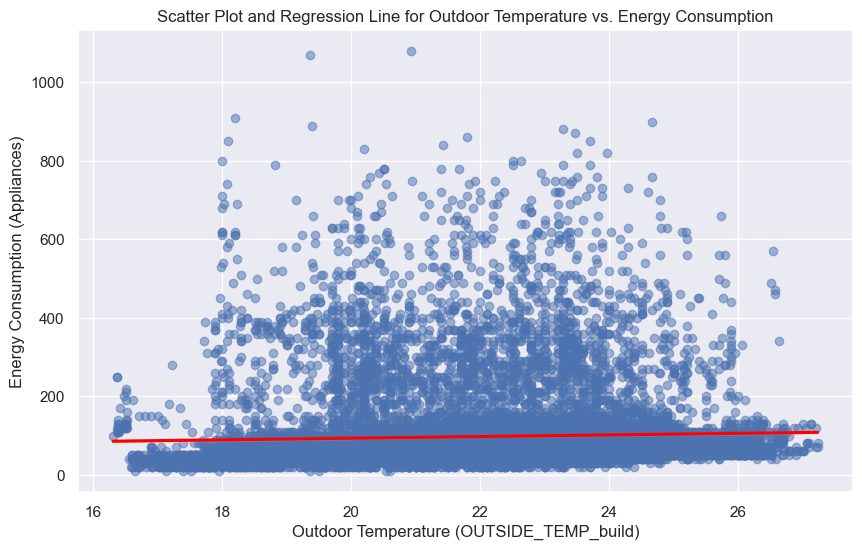

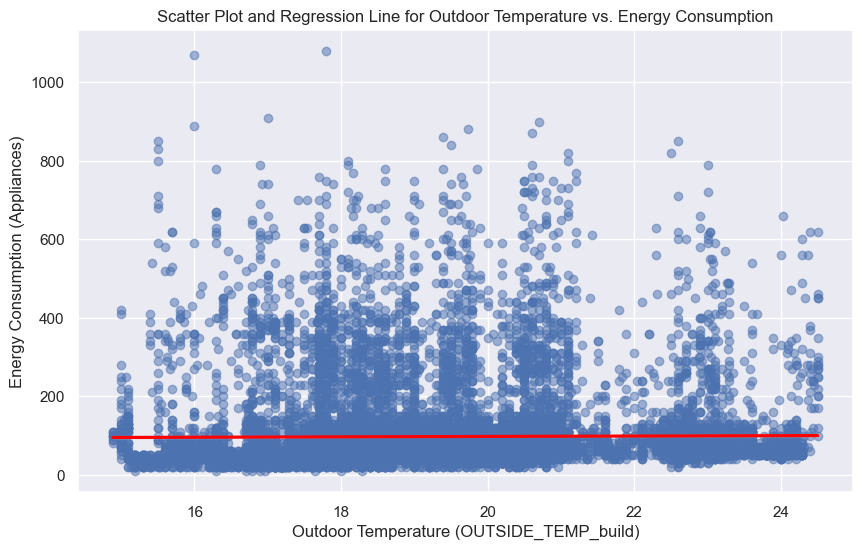

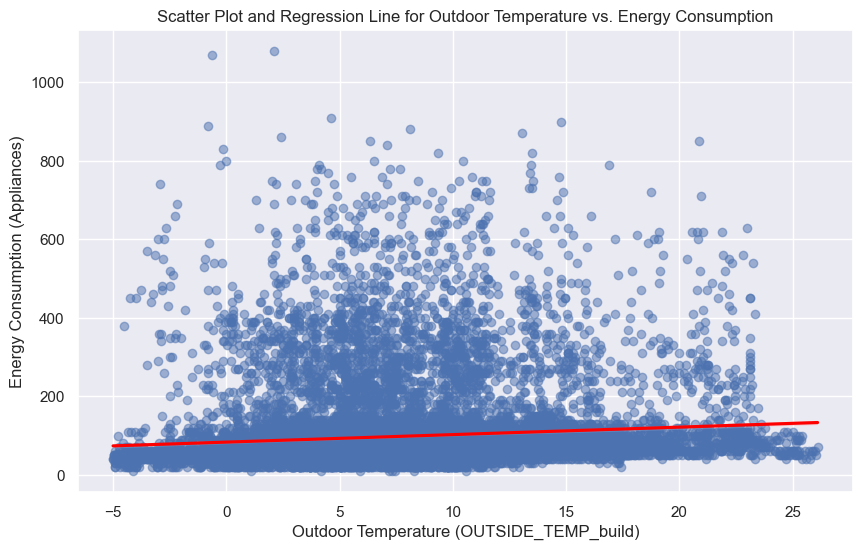

In [125]:
#  scatter plot with a regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='KITCHEN_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Indoor Temperature vs. Energy Consumption')
plt.xlabel('Indoor Temperature (KITCHEN_TEMP)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

# scatter plot with a regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='LIVING_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Indoor Temperature vs. Energy Consumption')
plt.xlabel('Indoor Temperature (KITCHEN_TEMP)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

# scatter plot with a regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='BEDROOM_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Indoor Temperature vs. Energy Consumption')
plt.xlabel('Indoor Temperature (KITCHEN_TEMP)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

# You can create a scatter plot with a regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='BEDROOM_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Indoor Temperature vs. Energy Consumption')
plt.xlabel('Indoor Temperature (KITCHEN_TEMP)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

# You can create a scatter plot with a regression line for outdoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='OUTSIDE_TEMP_build', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Indoor Temperature vs. Energy Consumption')
plt.xlabel('Indoor Temperature (KITCHEN_TEMP)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

# You can also create a similar scatter plot and regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='IRONING_ROOM_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Outdoor Temperature vs. Energy Consumption')
plt.xlabel('Outdoor Temperature (OUTSIDE_TEMP_build)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

# You can also create a similar scatter plot and regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='TEEN_ROOM_2_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Outdoor Temperature vs. Energy Consumption')
plt.xlabel('Outdoor Temperature (OUTSIDE_TEMP_build)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

# You can also create a similar scatter plot and regression line for indoor temperature vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='PARENTS_ROOM_TEMP', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Outdoor Temperature vs. Energy Consumption')
plt.xlabel('Outdoor Temperature (OUTSIDE_TEMP_build)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

# You can also create a similar scatter plot and regression line for outdoor temperature data from weather station vs. energy consumption
plt.figure(figsize=(10, 6))
sns.regplot(x='OUTSIDE_TEMP_wstn', y='Appliances', data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Scatter Plot and Regression Line for Outdoor Temperature vs. Energy Consumption')
plt.xlabel('Outdoor Temperature (OUTSIDE_TEMP_build)')
plt.ylabel('Energy Consumption (Appliances)')
plt.grid(True)

plt.show()


### Chart - 8

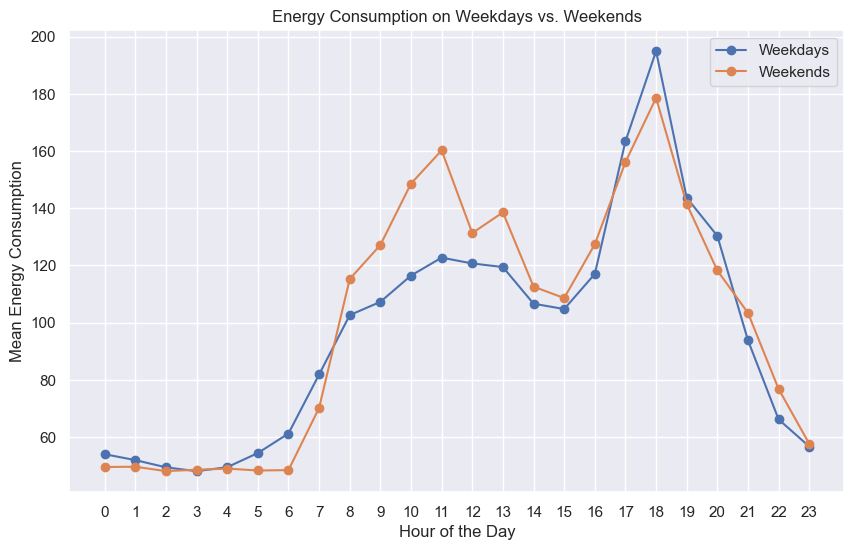

In [126]:
plt.figure(figsize=(10, 6))

# Group the data by 'weekday' and calculate the mean energy consumption for weekdays and weekends
weekday_energy = data[data['weekday'] < 5].groupby('hour')['Appliances'].mean()
weekend_energy = data[data['weekday'] >= 5].groupby('hour')['Appliances'].mean()

# Plot energy consumption for weekdays and weekends
plt.plot(weekday_energy.index, weekday_energy.values, label='Weekdays', marker='o')
plt.plot(weekend_energy.index, weekend_energy.values, label='Weekends', marker='o')

plt.title('Energy Consumption on Weekdays vs. Weekends')
plt.xlabel('Hour of the Day')
plt.ylabel('Mean Energy Consumption')
plt.xticks(range(24))
plt.grid(True)
plt.legend()

plt.show()

energy consumption patterns significantly differ between weekdays and weekends. On weekdays, there is a notable increase in energy consumption during the evening hours

### Chart - 9

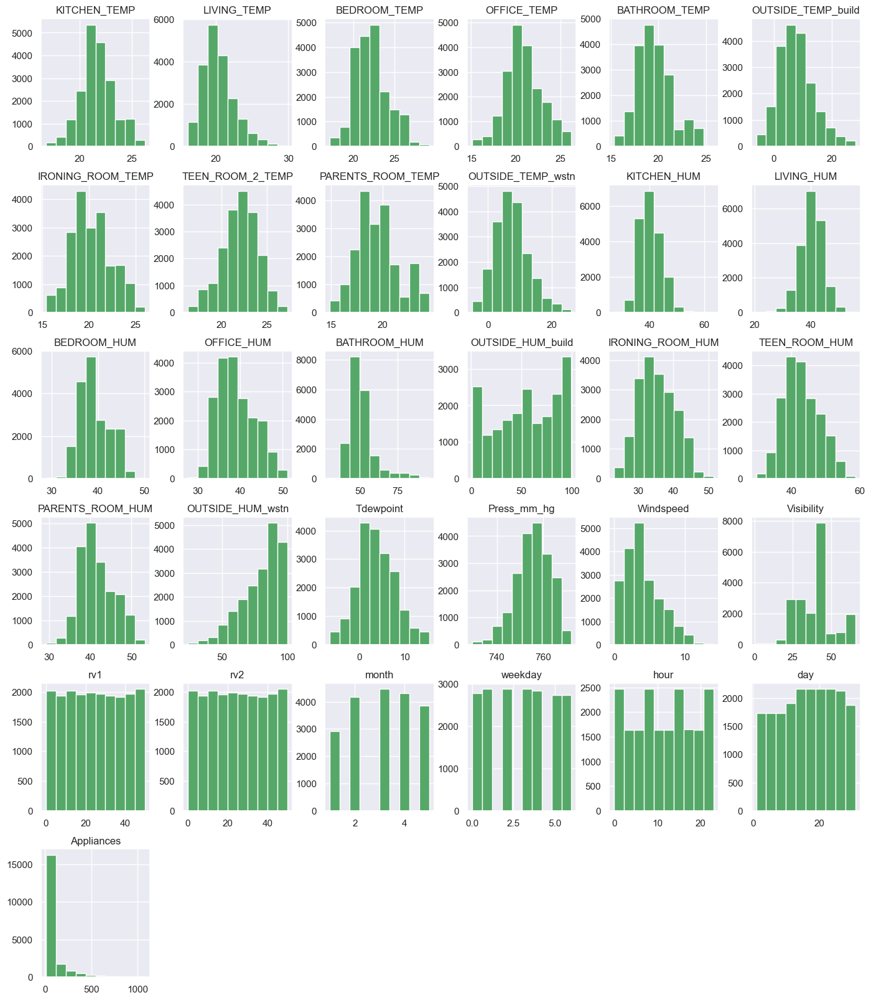

In [127]:
# Visualizing distributions using Histograms:
data.hist(figsize=(17, 20), grid=True,color='g');

### Chart - 10

Text(0.5, 1.0, 'Correlation Heatmap for Selected Columns')

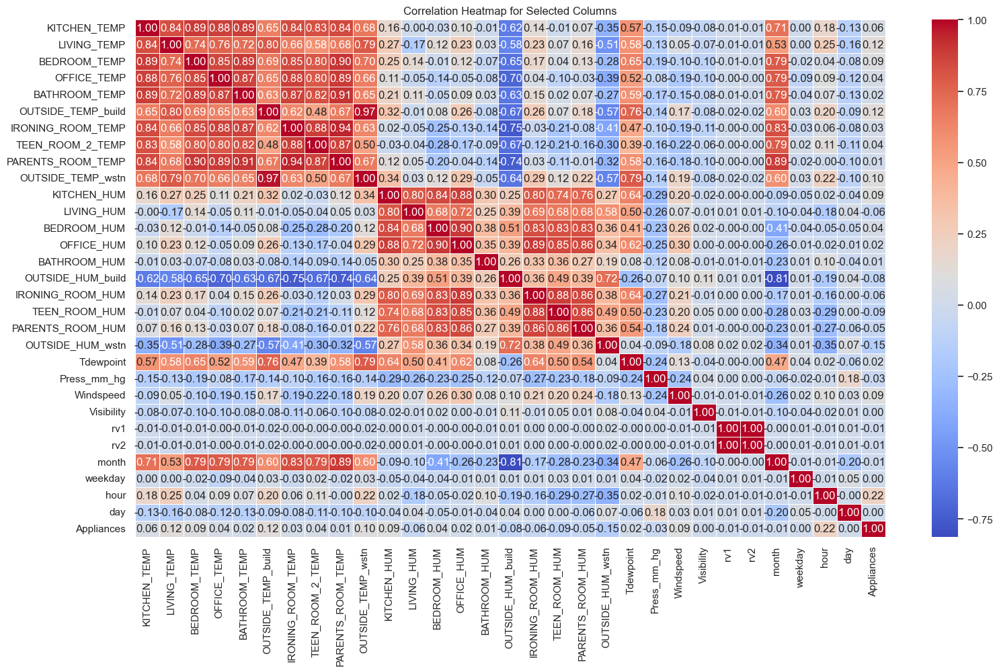

In [128]:
# Select a subset of columns for the heatmap
columns_for_heatmap = data.columns[:34]  # Adjust the range based on your preference

# Create a correlation matrix for the selected columns
correlation_matrix = data[columns_for_heatmap].corr()

# Plotting the heatmap
plt.figure(figsize=(18, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)

# Adding title
plt.title('Correlation Heatmap for Selected Columns')

red indicates a strong positive correlation and blue indicates a strong negative correlation.



### Chart - 11 - Pair Plot

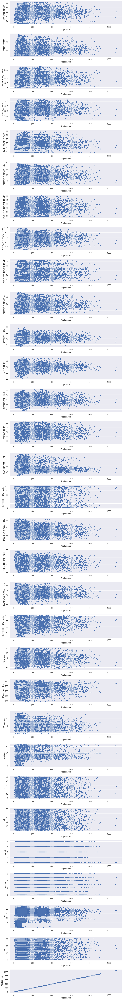

In [129]:
# Get the list of column names in your dataset
columns = data.columns

# Determine the number of rows and columns for subplots
num_rows = len(columns)
num_cols = 1

# Create subplots with specified number of rows and columns
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(10, 80))

# Iterate over each column (excluding "Appliances") and create pair plot
for i, column in enumerate(columns):
    #if column != "Appliances":
        sns.scatterplot(data=data, x="Appliances", y=column, ax=axes[i])
        axes[i].set_xlabel("Appliances")
        axes[i].set_ylabel(column)

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

# 6. Feature Engineering & Data Pre-processing

## 1. Handling Missing Values

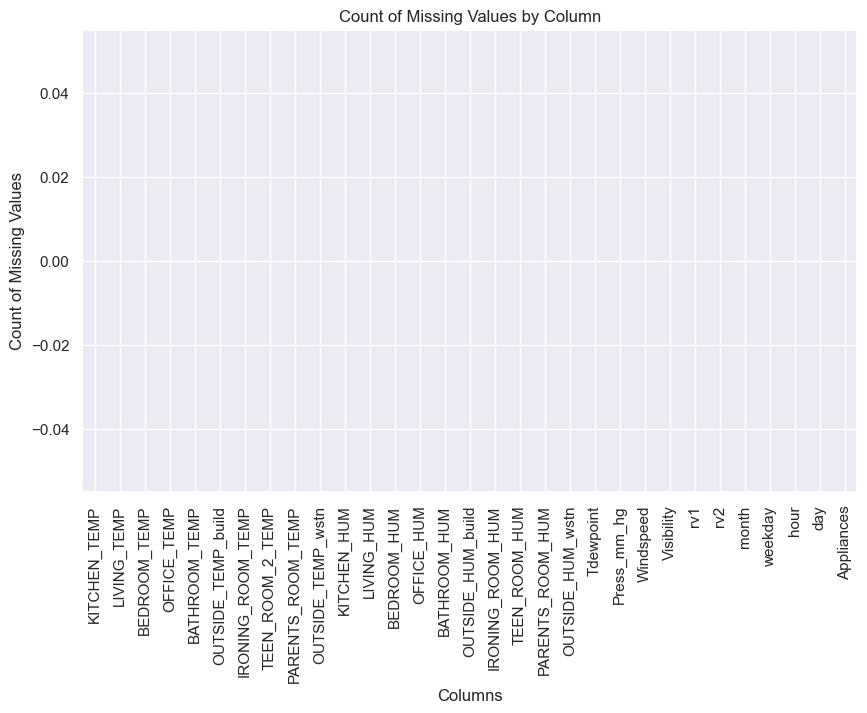

In [131]:
# Missing Values/Null Values Count
missing_values = data.isna().sum()

# Create a bar plot to visualize the count of missing values
plt.figure(figsize=(10, 6))
missing_values.plot(kind='bar')
plt.title('Count of Missing Values by Column')
plt.xlabel('Columns')
plt.ylabel('Count of Missing Values')
plt.show()


## 2. Handling Outliers

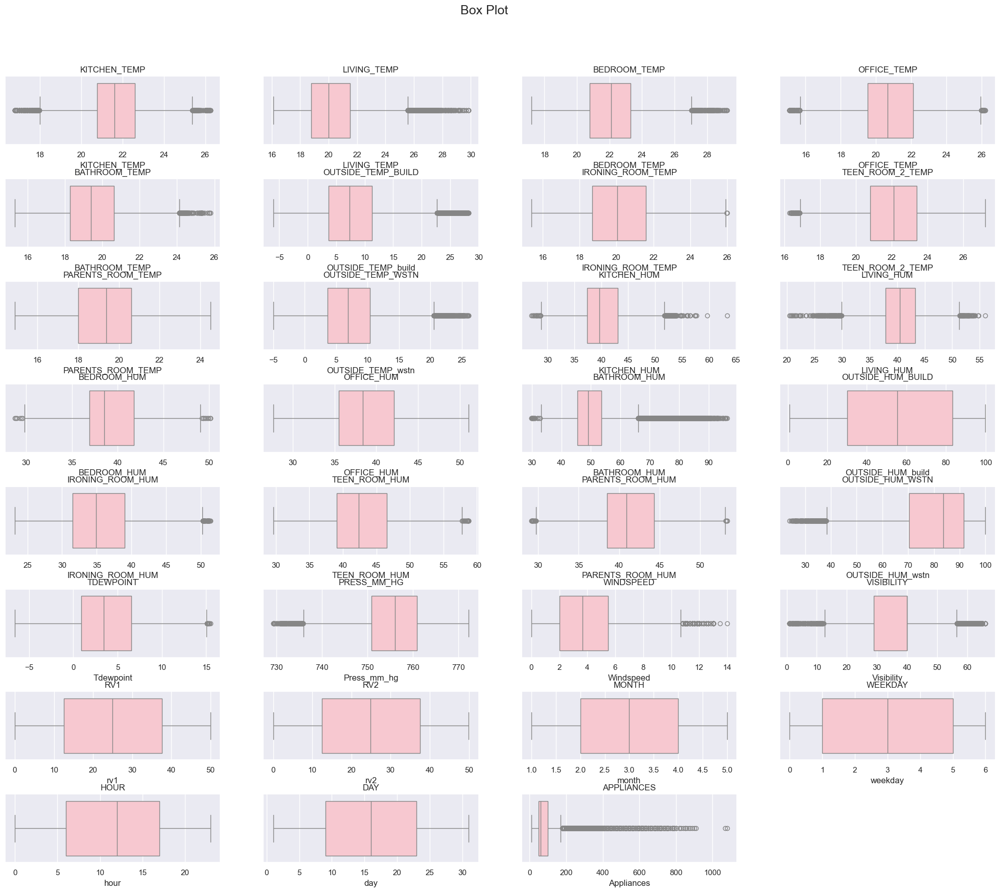

In [132]:
# Handling Outliers & Outlier treatments
df= data.copy()
col_list = list(df.describe().columns)

#find the outliers using boxplot
plt.figure(figsize=(25, 20))
plt.suptitle("Box Plot", fontsize=18, y=0.95)

for n, ticker in enumerate(col_list):

    ax = plt.subplot(8, 4, n + 1)

    plt.subplots_adjust(hspace=0.5, wspace=0.2)

    sns.boxplot(x=df[ticker],color='pink', ax = ax)

    # chart formatting
    ax.set_title(ticker.upper())

In [42]:
# Handling Outliers & Outlier treatments
import pandas as pd
import numpy as np

def find_outliers_iqr(data):
    # Calculate the first quartile (Q1) and third quartile (Q3) for each column
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)

    # Calculate the interquartile range (IQR) for each column
    iqr = q3 - q1

    # Calculate the lower and upper bounds for outliers for each column
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
        # Check for outliers in each column and count the number of outliers
    outliers_count = (data < lower_bound) | (data > upper_bound)
    num_outliers = outliers_count.sum()

    return num_outliers


outliers_per_column = find_outliers_iqr(data)
print("Number of outliers per column:")
print(outliers_per_column.sort_values(ascending = False))


Number of outliers per column:
Visibility            2522
Appliances            2138
BATHROOM_HUM          1330
LIVING_TEMP            546
OUTSIDE_TEMP_build     515
KITCHEN_TEMP           515
OUTSIDE_TEMP_wstn      436
OUTSIDE_HUM_wstn       239
LIVING_HUM             235
Press_mm_hg            219
BEDROOM_TEMP           217
Windspeed              214
OFFICE_TEMP            186
BATHROOM_TEMP          179
KITCHEN_HUM            146
TEEN_ROOM_2_TEMP        71
IRONING_ROOM_HUM        42
PARENTS_ROOM_HUM        21
TEEN_ROOM_HUM           17
BEDROOM_HUM             15
Tdewpoint               10
IRONING_ROOM_TEMP        2
OFFICE_HUM               0
PARENTS_ROOM_TEMP        0
rv1                      0
rv2                      0
month                    0
weekday                  0
hour                     0
day                      0
OUTSIDE_HUM_build        0
dtype: int64


In [133]:

# Handling Outliers & Outlier treatments
for ftr in col_list:
    print(ftr, '\n')
    q_25 = np.percentile(df[ftr], 25)
    q_75 = np.percentile(df[ftr], 75)
    iqr = q_75 - q_25
    print('Percentiles: 25th=%.3f, 75th=%.3f, IQR=%.3f' % (q_25, q_75, iqr))
    # calculate the outlier cutoff
    cut_off = iqr * 1.5
    lower = q_25 - cut_off
    upper = q_75 + cut_off
    print(f"\nlower = {lower} and upper = {upper} \n ")
    # identify outliers
    outliers = [x for x in df[ftr] if x < lower or x > upper]
    print('Identified outliers: %d' % len(outliers))
    # removing outliers

    if len(outliers) != 0:

        def bin(row):
            if row[ftr] > upper:
                return upper
            if row[ftr] < lower:
                return lower
            else:
                return row[ftr]

        data[ftr] = df.apply(lambda row: bin(row), axis=1)
        print(f"{ftr} Outliers Removed")
    print("\n-------\n")


KITCHEN_TEMP 

Percentiles: 25th=20.760, 75th=22.600, IQR=1.840

lower = 18.0 and upper = 25.36 
 
Identified outliers: 515
KITCHEN_TEMP Outliers Removed

-------

LIVING_TEMP 

Percentiles: 25th=18.790, 75th=21.500, IQR=2.710

lower = 14.724999999999998 and upper = 25.565 
 
Identified outliers: 546
LIVING_TEMP Outliers Removed

-------

BEDROOM_TEMP 

Percentiles: 25th=20.790, 75th=23.290, IQR=2.500

lower = 17.04 and upper = 27.04 
 
Identified outliers: 217
BEDROOM_TEMP Outliers Removed

-------

OFFICE_TEMP 

Percentiles: 25th=19.530, 75th=22.100, IQR=2.570

lower = 15.675 and upper = 25.955000000000002 
 
Identified outliers: 186
OFFICE_TEMP Outliers Removed

-------

BATHROOM_TEMP 

Percentiles: 25th=18.277, 75th=20.620, IQR=2.342

lower = 14.764285714285725 and upper = 24.132857142857127 
 
Identified outliers: 179
BATHROOM_TEMP Outliers Removed

-------

OUTSIDE_TEMP_build 

Percentiles: 25th=3.627, 75th=11.256, IQR=7.629

lower = -7.817333333333325 and upper = 22.699999999999

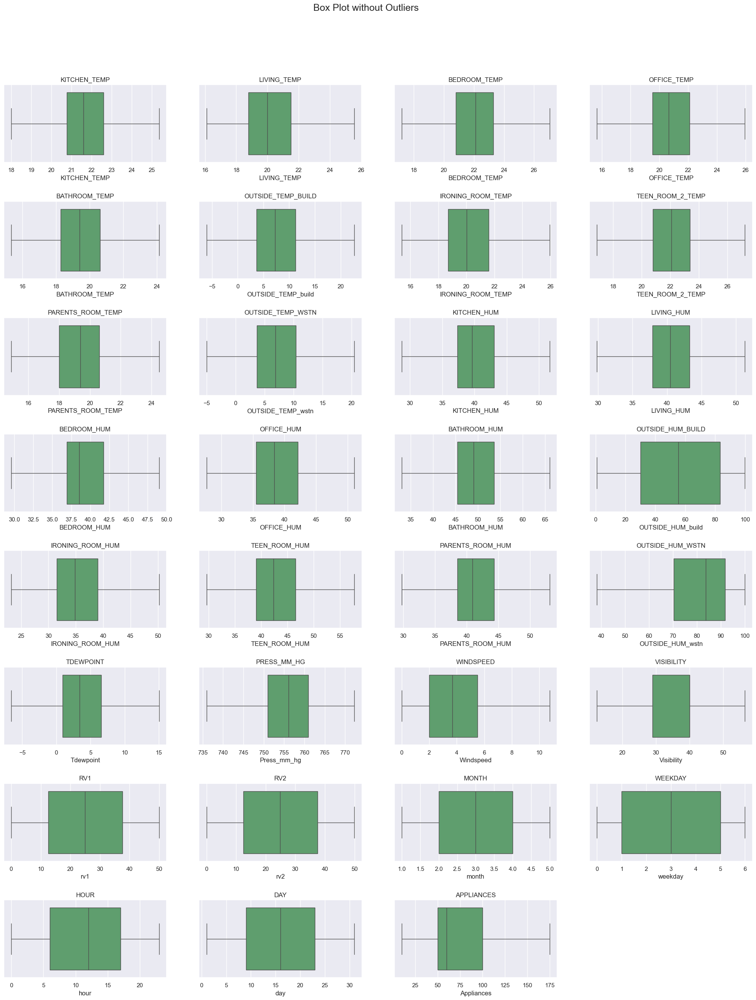

In [44]:
plt.figure(figsize=(25, 30))
plt.suptitle("Box Plot without Outliers", fontsize=18, y=0.95)
#plot the all figures in loop with boxplot
for n, ticker in enumerate(col_list):

    ax = plt.subplot(8, 4, n + 1)

    plt.subplots_adjust(hspace=0.5, wspace=0.2)

    sns.boxplot(x=data[ticker],color='g' ,ax = ax)

    # chart formatting
    ax.set_title(ticker.upper())

In [45]:
#examining the shape after
data.shape

(19735, 31)

## 3. Feature Manipulation & Selection

### 1. Feature Manipulation

In [134]:
# Manipulate Features to minimize feature correlation and create new features
# create new features

# create a column average building temperature based on all temperature
data['Average_building_Temperature']=data[['KITCHEN_TEMP','LIVING_TEMP','BEDROOM_TEMP','OFFICE_TEMP','BATHROOM_TEMP','IRONING_ROOM_TEMP','TEEN_ROOM_2_TEMP','PARENTS_ROOM_TEMP']].mean(axis=1)

#create a column of difference between outside and inside temperature
data['Temperature_difference']=abs(data['Average_building_Temperature']-data['OUTSIDE_TEMP_build'])


#create a column average building humidity
data['Average_building_humidity']=data[['KITCHEN_HUM','LIVING_HUM','BEDROOM_HUM', 'OFFICE_HUM','BATHROOM_HUM','IRONING_ROOM_HUM','TEEN_ROOM_HUM','PARENTS_ROOM_HUM']].mean(axis=1)

#create a column of difference between outside and inside building humidity
data['Humidity_difference']=abs(data['OUTSIDE_HUM_build']-data['Average_building_humidity'])

In [135]:
# drop random variables as it does not look like that much important while predicting the output
columns_to_drop = ['rv1','rv2']
data.drop(columns_to_drop, axis=1, inplace=True)

In [136]:
data.shape

(19735, 33)

### Finding the skewed and symmetrical data

In [137]:
#examining the skewness in the dataset to check the distribution
skewness = data.skew()

#ginding the absolute value
abs(skewness)

# setting up the threshold
skewness_threshold = 0.5

# Separate features into symmetrical and skewed based on skewness threshold
symmetrical_features = skewness[abs(skewness) < skewness_threshold].index
skewed_features = skewness[abs(skewness) >= skewness_threshold].index

# Create new DataFrames for symmetrical and skewed features
print('FEATURES FOLLOWED SYMMETRICAL DISTRIBUTION :')
symmetrical_data = data[symmetrical_features]
print(symmetrical_features)
print("\n-------\n")
print('FEATURES FOLLOWED SKEWED DISTRIBUTION :')
skewed_data = data[skewed_features]
print(skewed_features)

FEATURES FOLLOWED SYMMETRICAL DISTRIBUTION :
Index(['KITCHEN_TEMP', 'BEDROOM_TEMP', 'OFFICE_TEMP', 'OUTSIDE_TEMP_build',
       'IRONING_ROOM_TEMP', 'TEEN_ROOM_2_TEMP', 'PARENTS_ROOM_TEMP',
       'OUTSIDE_TEMP_wstn', 'KITCHEN_HUM', 'LIVING_HUM', 'BEDROOM_HUM',
       'OFFICE_HUM', 'OUTSIDE_HUM_build', 'IRONING_ROOM_HUM', 'TEEN_ROOM_HUM',
       'PARENTS_ROOM_HUM', 'Tdewpoint', 'Press_mm_hg', 'Visibility', 'month',
       'weekday', 'hour', 'day', 'Average_building_Temperature',
       'Temperature_difference', 'Average_building_humidity',
       'Humidity_difference'],
      dtype='object')

-------

FEATURES FOLLOWED SKEWED DISTRIBUTION :
Index(['LIVING_TEMP', 'BATHROOM_TEMP', 'BATHROOM_HUM', 'OUTSIDE_HUM_wstn',
       'Windspeed', 'Appliances'],
      dtype='object')


## 5. Data Transformation

In [138]:
#examining the skewed data
skewed_data

,LIVING_TEMP,BATHROOM_TEMP,BATHROOM_HUM,OUTSIDE_HUM_wstn,Windspeed,Appliances
date,,,,,,
2016-01-11 17:00:00,19.200000,17.166667,55.200000,92.000000,7.000000,60.0
2016-01-11 17:10:00,19.200000,17.166667,55.200000,92.000000,6.666667,60.0
2016-01-11 17:20:00,19.200000,17.166667,55.090000,92.000000,6.333333,50.0
2016-01-11 17:30:00,19.200000,17.166667,55.090000,92.000000,6.000000,50.0
2016-01-11 17:40:00,19.200000,17.200000,55.090000,92.000000,5.666667,60.0
...,...,...,...,...,...,...
2016-05-27 17:20:00,25.565000,23.200000,52.400000,55.666667,3.333333,100.0
2016-05-27 17:30:00,25.565000,23.230000,52.326667,56.000000,3.500000,90.0
2016-05-27 17:40:00,25.565000,23.230000,52.266667,56.333333,3.666667,175.0


In [140]:
#import the liabrary
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PowerTransformer

# Initialize the PowerTransformer
power_transformer = PowerTransformer()

# Fit and transform the data using the PowerTransformer
power_transformed = pd.DataFrame(power_transformer.fit_transform(skewed_data))
power_transformed.columns = skewed_data.columns

power transformation is to reduce the skewness in the skewed features, making their distributions more symmetric and closer to a normal distribution.

In [141]:
#examining the power transformed data
power_transformed

,LIVING_TEMP,BATHROOM_TEMP,BATHROOM_HUM,OUTSIDE_HUM_wstn,Windspeed,Appliances
0,-0.454658,-1.444557,0.822595,0.878538,1.196112,-0.240595
1,-0.454658,-1.444557,0.822595,0.878538,1.105732,-0.240595
2,-0.454658,-1.444557,0.809032,0.878538,1.011588,-0.620965
3,-0.454658,-1.444557,0.809032,0.878538,0.913340,-0.620965
4,-0.454658,-1.420253,0.809032,0.878538,0.810601,-0.240595
...,...,...,...,...,...,...
19730,2.061339,1.773572,0.458243,-1.534519,-0.083185,0.758242
19731,2.061339,1.785203,0.448136,-1.521899,-0.005830,0.560135
19732,2.061339,1.785203,0.439844,-1.509132,0.068883,1.744721
19733,2.019912,1.773572,0.430606,-1.496217,0.141133,1.744721


In [142]:
# Reset the index to the default integer index
symmetrical_data.reset_index(drop=True, inplace=True)

In [54]:
#examining the symmetrical data
symmetrical_data

,KITCHEN_TEMP,BEDROOM_TEMP,OFFICE_TEMP,OUTSIDE_TEMP_build,IRONING_ROOM_TEMP,TEEN_ROOM_2_TEMP,PARENTS_ROOM_TEMP,OUTSIDE_TEMP_wstn,KITCHEN_HUM,LIVING_HUM,BEDROOM_HUM,OFFICE_HUM,OUTSIDE_HUM_build,IRONING_ROOM_HUM,TEEN_ROOM_HUM,PARENTS_ROOM_HUM,Tdewpoint,Press_mm_hg,Visibility,month,weekday,hour,day,Average_building_Temperature,Temperature_difference,Average_building_humidity,Humidity_difference
0,19.89,19.790000,19.000000,7.026667,17.200000,18.2000,17.033333,6.600000,47.596667,44.790000,44.730000,45.566667,84.256667,41.626667,48.900000,45.5300,5.300000,735.933333,56.500000,1,0,17,11,18.435000,11.408333,46.742500,37.514167
1,19.89,19.790000,19.000000,6.833333,17.200000,18.2000,17.066667,6.483333,46.693333,44.722500,44.790000,45.992500,84.063333,41.560000,48.863333,45.5600,5.200000,735.933333,56.500000,1,0,17,11,18.439167,11.605833,46.672708,37.390625
2,19.89,19.790000,18.926667,6.560000,17.200000,18.2000,17.000000,6.366667,46.300000,44.626667,44.933333,45.890000,83.156667,41.433333,48.730000,45.5000,5.100000,735.933333,55.333333,1,0,17,11,18.421667,11.861667,46.562917,36.593750
3,19.89,19.790000,18.890000,6.433333,17.133333,18.1000,17.000000,6.250000,46.066667,44.590000,45.000000,45.723333,83.423333,41.290000,48.590000,45.4000,5.000000,735.933333,51.500000,1,0,17,11,18.396250,11.962917,46.468750,36.954583
4,19.89,19.790000,18.890000,6.366667,17.200000,18.1000,17.000000,6.133333,46.333333,44.530000,45.000000,45.530000,84.893333,41.230000,48.590000,45.4000,4.900000,735.933333,47.666667,1,0,17,11,18.408750,12.042083,46.462917,38.430417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,25.36,27.040000,24.700000,22.700000,24.500000,24.7000,23.200000,20.520833,46.560000,42.025714,41.163333,45.590000,1.000000,44.500000,50.074000,46.7900,13.333333,755.200000,23.666667,5,4,17,27,24.783125,2.083125,46.137881,45.137881
19731,25.36,27.040000,24.700000,22.700000,24.557143,24.7000,23.200000,20.520833,46.500000,42.080000,41.223333,45.590000,1.000000,44.414286,49.790000,46.7900,13.300000,755.200000,24.500000,5,4,17,27,24.794018,2.094018,46.089286,45.089286
19732,25.36,27.040000,24.700000,22.700000,24.540000,24.7000,23.200000,20.520833,46.596667,42.768571,41.690000,45.730000,1.000000,44.400000,49.660000,46.7900,13.266667,755.200000,25.333333,5,4,17,27,24.791875,2.091875,46.237738,45.237738
19733,25.36,26.890000,24.700000,22.433333,24.500000,24.6625,23.200000,20.520833,46.990000,43.036000,41.290000,45.790000,1.000000,44.295714,49.518750,46.8175,13.233333,755.200000,26.166667,5,4,17,27,24.740813,2.307479,46.242246,45.242246


In [143]:
 #Concatenate horizontally (along columns)
tranformed_data = pd.concat([symmetrical_data, power_transformed], axis=1)

In [144]:
#examining the transformed data
tranformed_data

,KITCHEN_TEMP,BEDROOM_TEMP,OFFICE_TEMP,OUTSIDE_TEMP_build,IRONING_ROOM_TEMP,TEEN_ROOM_2_TEMP,PARENTS_ROOM_TEMP,OUTSIDE_TEMP_wstn,KITCHEN_HUM,LIVING_HUM,BEDROOM_HUM,OFFICE_HUM,OUTSIDE_HUM_build,IRONING_ROOM_HUM,TEEN_ROOM_HUM,PARENTS_ROOM_HUM,Tdewpoint,Press_mm_hg,Visibility,month,weekday,hour,day,Average_building_Temperature,Temperature_difference,Average_building_humidity,Humidity_difference,LIVING_TEMP,BATHROOM_TEMP,BATHROOM_HUM,OUTSIDE_HUM_wstn,Windspeed,Appliances
0,19.89,19.790000,19.000000,7.026667,17.200000,18.2000,17.033333,6.600000,47.596667,44.790000,44.730000,45.566667,84.256667,41.626667,48.900000,45.5300,5.300000,735.933333,56.500000,1,0,17,11,18.435000,11.408333,46.742500,37.514167,-0.454658,-1.444557,0.822595,0.878538,1.196112,-0.240595
1,19.89,19.790000,19.000000,6.833333,17.200000,18.2000,17.066667,6.483333,46.693333,44.722500,44.790000,45.992500,84.063333,41.560000,48.863333,45.5600,5.200000,735.933333,56.500000,1,0,17,11,18.439167,11.605833,46.672708,37.390625,-0.454658,-1.444557,0.822595,0.878538,1.105732,-0.240595
2,19.89,19.790000,18.926667,6.560000,17.200000,18.2000,17.000000,6.366667,46.300000,44.626667,44.933333,45.890000,83.156667,41.433333,48.730000,45.5000,5.100000,735.933333,55.333333,1,0,17,11,18.421667,11.861667,46.562917,36.593750,-0.454658,-1.444557,0.809032,0.878538,1.011588,-0.620965
3,19.89,19.790000,18.890000,6.433333,17.133333,18.1000,17.000000,6.250000,46.066667,44.590000,45.000000,45.723333,83.423333,41.290000,48.590000,45.4000,5.000000,735.933333,51.500000,1,0,17,11,18.396250,11.962917,46.468750,36.954583,-0.454658,-1.444557,0.809032,0.878538,0.913340,-0.620965
4,19.89,19.790000,18.890000,6.366667,17.200000,18.1000,17.000000,6.133333,46.333333,44.530000,45.000000,45.530000,84.893333,41.230000,48.590000,45.4000,4.900000,735.933333,47.666667,1,0,17,11,18.408750,12.042083,46.462917,38.430417,-0.454658,-1.420253,0.809032,0.878538,0.810601,-0.240595
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,25.36,27.040000,24.700000,22.700000,24.500000,24.7000,23.200000,20.520833,46.560000,42.025714,41.163333,45.590000,1.000000,44.500000,50.074000,46.7900,13.333333,755.200000,23.666667,5,4,17,27,24.783125,2.083125,46.137881,45.137881,2.061339,1.773572,0.458243,-1.534519,-0.083185,0.758242
19731,25.36,27.040000,24.700000,22.700000,24.557143,24.7000,23.200000,20.520833,46.500000,42.080000,41.223333,45.590000,1.000000,44.414286,49.790000,46.7900,13.300000,755.200000,24.500000,5,4,17,27,24.794018,2.094018,46.089286,45.089286,2.061339,1.785203,0.448136,-1.521899,-0.005830,0.560135
19732,25.36,27.040000,24.700000,22.700000,24.540000,24.7000,23.200000,20.520833,46.596667,42.768571,41.690000,45.730000,1.000000,44.400000,49.660000,46.7900,13.266667,755.200000,25.333333,5,4,17,27,24.791875,2.091875,46.237738,45.237738,2.061339,1.785203,0.439844,-1.509132,0.068883,1.744721
19733,25.36,26.890000,24.700000,22.433333,24.500000,24.6625,23.200000,20.520833,46.990000,43.036000,41.290000,45.790000,1.000000,44.295714,49.518750,46.8175,13.233333,755.200000,26.166667,5,4,17,27,24.740813,2.307479,46.242246,45.242246,2.019912,1.773572,0.430606,-1.496217,0.141133,1.744721


### 6. Scaling the DATA set

In [182]:
#importing the desired liabrary
from sklearn.preprocessing import StandardScaler

# StandardScaler
scaler = StandardScaler()
scaled_data = pd.DataFrame(scaler.fit_transform(tranformed_data))
scaled_data.columns = tranformed_data.columns
scaled_data

,KITCHEN_TEMP,BEDROOM_TEMP,OFFICE_TEMP,OUTSIDE_TEMP_build,IRONING_ROOM_TEMP,TEEN_ROOM_2_TEMP,PARENTS_ROOM_TEMP,OUTSIDE_TEMP_wstn,KITCHEN_HUM,LIVING_HUM,BEDROOM_HUM,OFFICE_HUM,OUTSIDE_HUM_build,IRONING_ROOM_HUM,TEEN_ROOM_HUM,PARENTS_ROOM_HUM,Tdewpoint,Press_mm_hg,Visibility,month,weekday,hour,day,Average_building_Temperature,Temperature_difference,Average_building_humidity,Humidity_difference,LIVING_TEMP,BATHROOM_TEMP,BATHROOM_HUM,OUTSIDE_HUM_wstn,Windspeed,Appliances
0,-1.139072,-1.245155,-0.912635,-0.139440,-1.453651,-1.961010,-1.217324,-0.147777,1.863478,1.092582,1.686863,1.506438,0.951798,1.220911,1.142031,0.958298,0.367016,-2.684267,1.799947,-1.569369,-1.499445,0.794304,-0.598455,-1.322817,-0.319773,1.443785,0.575892,-0.454658,-1.444557,0.822595,0.878538,1.196112,-0.240595
1,-1.139072,-1.245155,-0.912635,-0.172007,-1.453651,-1.961010,-1.200778,-0.170232,1.634348,1.075633,1.705307,1.604528,0.945592,1.207866,1.135010,0.965526,0.343175,-2.684267,1.799947,-1.569369,-1.499445,0.794304,-0.598455,-1.320497,-0.278974,1.425825,0.568355,-0.454658,-1.444557,0.822595,0.878538,1.105732,-0.240595
2,-1.139072,-1.245155,-0.948663,-0.218049,-1.453651,-1.961010,-1.233869,-0.192686,1.534580,1.051570,1.749367,1.580918,0.916484,1.183081,1.109480,0.951070,0.319333,-2.684267,1.687977,-1.569369,-1.499445,0.794304,-0.598455,-1.330241,-0.226123,1.397571,0.519744,-0.454658,-1.444557,0.809032,0.878538,1.011588,-0.620965
3,-1.139072,-1.245155,-0.966677,-0.239386,-1.485247,-2.012209,-1.233869,-0.215141,1.475395,1.042363,1.769859,1.542526,0.925045,1.155035,1.082673,0.926976,0.295491,-2.684267,1.320076,-1.569369,-1.499445,0.794304,-0.598455,-1.344393,-0.205207,1.373338,0.541756,-0.454658,-1.444557,0.809032,0.878538,0.913340,-0.620965
4,-1.139072,-1.245155,-0.966677,-0.250616,-1.453651,-2.012209,-1.233869,-0.237595,1.543034,1.027297,1.769859,1.497991,0.972238,1.143295,1.082673,0.926976,0.271649,-2.684267,0.952175,-1.569369,-1.499445,0.794304,-0.598455,-1.337433,-0.188853,1.371837,0.631785,-0.454658,-1.420253,0.809032,0.878538,0.810601,-0.240595
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,2.322581,2.411061,1.887732,2.500708,2.006178,1.366913,1.843571,2.531521,1.600528,0.398479,0.590497,1.511812,-1.721052,1.783138,1.366822,1.261883,2.282311,-0.048335,-1.351208,1.417563,0.515093,0.794304,1.294861,2.211860,-2.246186,1.288192,1.040955,2.061339,1.773572,0.458243,-1.534519,-0.083185,0.758242
19731,2.322581,2.411061,1.887732,2.500708,2.033260,1.366913,1.843571,2.531521,1.585309,0.412110,0.608941,1.511812,-1.721052,1.766366,1.312443,1.261883,2.274364,-0.048335,-1.271229,1.417563,0.515093,0.794304,1.294861,2.217925,-2.243936,1.275687,1.037991,2.061339,1.785203,0.448136,-1.521899,-0.005830,0.560135
19732,2.322581,2.411061,1.887732,2.500708,2.025136,1.366913,1.843571,2.531521,1.609829,0.585008,0.752391,1.544061,-1.721052,1.763571,1.287552,1.261883,2.266417,-0.048335,-1.191250,1.417563,0.515093,0.794304,1.294861,2.216732,-2.244379,1.313890,1.047047,2.061339,1.785203,0.439844,-1.509132,0.068883,1.744721
19733,2.322581,2.335416,1.887732,2.455789,2.006178,1.347713,1.843571,2.531521,1.709597,0.652158,0.629434,1.557883,-1.721052,1.743165,1.260506,1.268509,2.258469,-0.048335,-1.111272,1.417563,0.515093,0.794304,1.294861,2.188300,-2.199839,1.315050,1.047322,2.019912,1.773572,0.430606,-1.496217,0.141133,1.744721


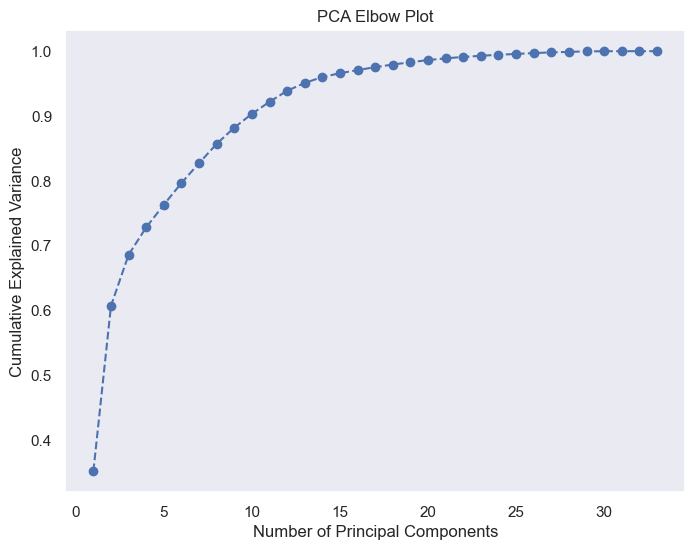

In [199]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Initialize a PCA instance without specifying the number of components
pca = PCA()

# Fit the PCA model to your standardized data
pca.fit(scaled_data)

# Calculate the cumulative explained variance
cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)

# Create an elbow plot to visualize the explained variance
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='o', linestyle='--')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Elbow Plot')
plt.grid()
plt.show()


# Create a PCA instance and specify the number of components you want to retain
# For example, if you want to retain 10 components, set n_components=10
n_components = 20
pca = PCA(n_components=n_components)

# Fit the PCA model to your standardized data and transform it
transformed_data_pca = pca.fit_transform(scaled_data)

# The variable 'transformed_data_pca' now contains your data in the reduced-dimensional space with 'n_components' principal components.

# You can also access explained variance to see how much variance is explained by each component
explained_variance = pca.explained_variance_ratio_

In [200]:
# the variances of the pca that we extract and there importance in predicting the output
explained_variance

array([0.35236576, 0.25503593, 0.07871699, 0.04230929, 0.03480131,
       0.03352274, 0.03062355, 0.02973118, 0.02503299, 0.02119849,
       0.01856342, 0.01704331, 0.01204174, 0.00917554, 0.00580541,
       0.00488788, 0.00446458, 0.00407573, 0.00351892, 0.00336032])

In [201]:
#calculating the total of  explained_variance  which needs to be more than 90%
explained_variance.sum()

0.9862750740087035

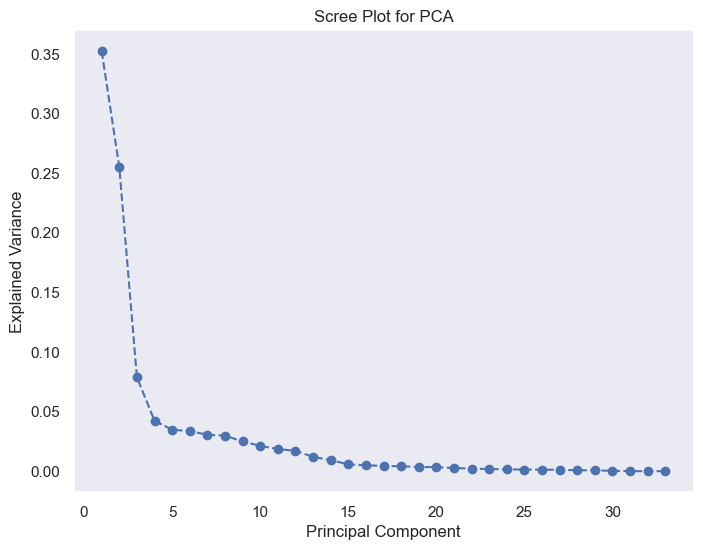

In [202]:
# Initialize a PCA instance without specifying the number of components
pca = PCA()

# Fit the PCA model to your standardized data
pca.fit(scaled_data)

# Calculate the explained variance for each component
explained_variance = pca.explained_variance_ratio_

# Create a scree plot
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance')
plt.title('Scree Plot for PCA')
plt.grid()
plt.show()

In [203]:
#examining the shape after pca
transformed_data_pca.shape

(19735, 20)

In [204]:
transformed_data_pca

array([[-3.63425954,  4.61564254, -1.63876977, ..., -0.11323001,
         0.26416571,  0.4174767 ],
       [-3.66200326,  4.54498791, -1.58036227, ..., -0.15394152,
         0.21629476,  0.3784375 ],
       [-3.73180129,  4.4589571 , -1.4367489 , ..., -0.17057477,
         0.20896774,  0.37715699],
       ...,
       [ 7.86669752,  3.93596189, -1.72425429, ..., -0.24266021,
         0.10122049, -0.04639861],
       [ 7.79961585,  3.93144725, -1.71653912, ..., -0.22616442,
         0.084665  , -0.03559629],
       [ 7.67068514,  3.84154959, -1.61218796, ..., -0.23513148,
         0.12411933, -0.00843285]])

### 8. Data Splitting

In [205]:
#assinign the independent and dependent feature
x = transformed_data_pca
y = data['Appliances']

In [206]:
#splitting the data into 80/20 ration
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=3)

In [207]:
x_test

array([[-0.90737842, -2.52831901,  0.94347769, ...,  0.40700919,
         0.34106402, -0.3749652 ],
       [ 2.46829273,  0.17688767,  0.93569616, ...,  0.16558458,
         0.30497879,  0.12484649],
       [-3.52817112, -3.84861449, -1.03075427, ...,  0.0301983 ,
        -0.03476719, -0.03547174],
       ...,
       [-1.82898708, -2.71310646,  2.78548811, ...,  0.11154364,
         0.59102155, -0.49709517],
       [ 0.46125653, -1.5191304 , -1.44268523, ...,  0.1809038 ,
        -0.21163024, -0.13374283],
       [-2.34343274,  2.23222529,  1.81279052, ...,  0.27728178,
        -0.16853296,  0.63327423]])

# 7. ML Model Implementation

### ML Model - 1 - Simple Linear Regression Model

In [208]:
#importing the mdoel
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

#defining the object
reg = LinearRegression()
model= reg.fit(x_train, y_train)

#training dataset score
training_score = reg.score(x_train, y_train)

#predicting the value
y_pred = reg.predict(x_test)

#calculating the training accuracy
print("Train score:" ,training_score)
#calculating the MSE
MSE  = mean_squared_error((y_test),(y_pred))
print("Test MSE :" , MSE)

#calculating the testing accuracy
r2 = r2_score((y_test),(y_pred))
print("Test R2 :" ,r2)

y_pred

Train score: 0.9009502351934775
Test MSE : 167.98629733276675
Test R2 : 0.9067575875361663


array([ 34.33776891, 108.34793006,  82.37696236, ...,  31.96824923,
        55.04070557,  67.97473853])

a.

In [209]:
y_pred[[500]] = reg.predict(x_test[[500]])
y_pred[[500]]

array([87.58447844])

In [210]:
y_test[[500]]

date
2016-05-04 07:50:00    80.0
Name: Appliances, dtype: float64

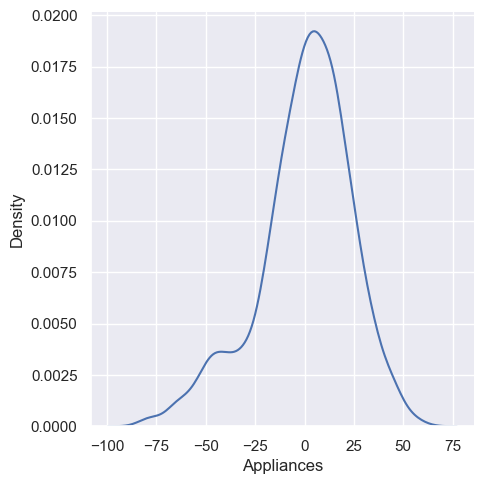

In [159]:
# Visualizing evaluation Metric Score chart
sns.displot(y_pred - y_test,kind ='kde')

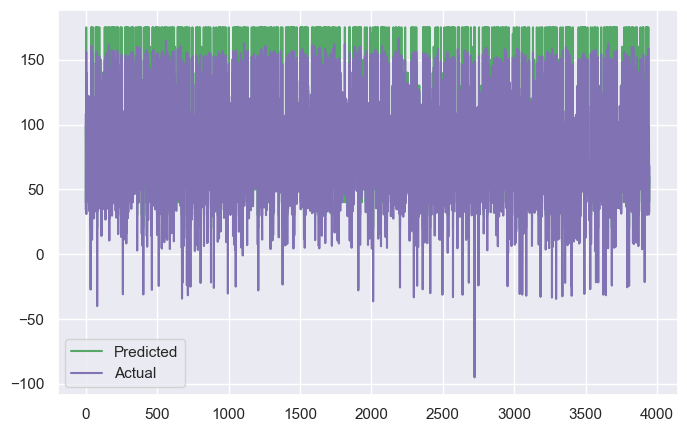

In [211]:
#plot to compare the predicted values against the actual values.
plt.figure(figsize=(8,5))
plt.plot(np.array(y_test), color='g')
plt.plot(y_pred, color='m')
plt.legend(["Predicted","Actual"])
plt.show()


## ML Model - 2 - Random Forest Regressor

In [212]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error, r2_score

# Set the degree of the polynomial features
degree = 2

# Create a Random Forest Regressor model
rf_model = RandomForestRegressor(n_estimators=20, random_state=42)

# Create polynomial features
poly_features = PolynomialFeatures(degree=degree)
X_train_poly = poly_features.fit_transform(x_train)
X_test_poly = poly_features.transform(x_test)

# Train the model
rf_model.fit(X_train_poly, y_train)

# Make predictions on the training and test data
train_predictions_rf = rf_model.predict(X_train_poly)
test_predictions_rf = rf_model.predict(X_test_poly)

# Evaluate the model
train_mse_rf = mean_squared_error(y_train, train_predictions_rf)
test_mse_rf = mean_squared_error(y_test, test_predictions_rf)

train_r2_rf = r2_score(y_train, train_predictions_rf)
test_r2_rf = r2_score(y_test, test_predictions_rf)


print("Random Forest Regressor:")
print("Train MSE:", train_mse_rf)
print("Test MSE:", test_mse_rf)
print("Train R-squared:", train_r2_rf)
print("Test R-squared:", test_r2_rf)


Random Forest Regressor:
Train MSE: 14.000399828984039
Test MSE: 80.62355903217633
Train R-squared: 0.9924578005503325
Test R-squared: 0.9552491169521474


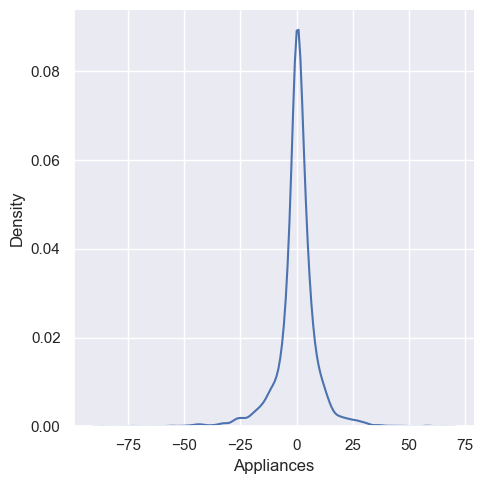

In [213]:
# Visualizing evaluation Metric Score chart
sns.displot(test_predictions_rf - y_test,kind ='kde')

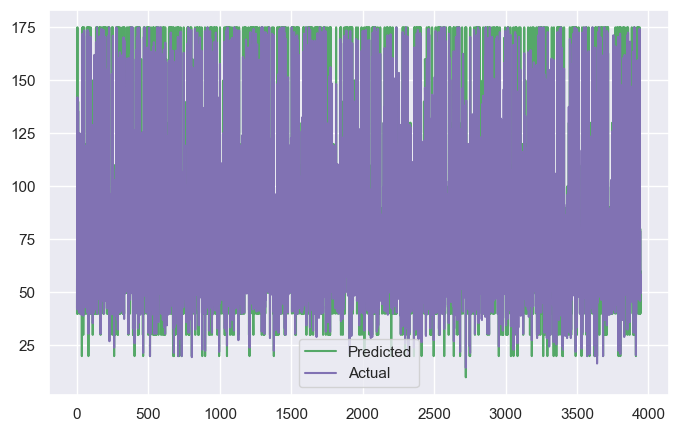

In [214]:
plt.figure(figsize=(8,5))
plt.plot(np.array(y_test),color='g')
plt.plot(test_predictions_rf, color='m')
plt.legend(["Predicted","Actual"])
plt.show()